# COMP0123 :  Complex Networks and Online Social Networks
## Coursework 
## Analysis of the Quantum Science and Technology Collaboration Network between 2021 and 2025

imports

In [6]:
import os
import pandas as pd
import pandas as pd
import networkx as nx
from itertools import combinations
import matplotlib.pyplot as plt
import regex as re
from networkx.algorithms.community import louvain_communities

## 1. Prepare Data

In [7]:


DATA_DIR = "data"

records = []

for fname in os.listdir(DATA_DIR):
    if not fname.endswith(".txt"):
        continue

    with open(os.path.join(DATA_DIR, fname), encoding="utf-8", errors="ignore") as f:
        content = f.read()

    # Split individual records
    raw_records = content.split("\nER\n")

    for raw in raw_records:
        rec = {}
        lines = raw.split("\n")

        current_tag = None
        for line in lines:
            if len(line) < 2:
                continue

            # WoS tags are 2 characters
            tag = line[:2]
            value = line[3:].strip() if len(line) > 3 else ""

            if tag.isupper():
                current_tag = tag
                rec[tag] = value
            else:
                # continuation line
                if current_tag:
                    rec[current_tag] += " " + line.strip()

        if rec:
            records.append(rec)

df = pd.DataFrame(records)
print(df.shape)

(29977, 40)


In [8]:
df.head()

,﻿F,VR,PT,AU,AF,TI,SO,AB,RI,OI,...,BE,SE,HO,PN,CA,EF,SU,BA,BF,D2
0,Clarivate Analytics Web of Science,1.0,J,"Sinko, MR de la Barrera, SC Lanes, O Watanabe,...","Sinko, Michael R. de la Barrera, Sergio C. Lan...",Superconducting contact and quantum interferen...,PHYSICAL REVIEW MATERIALS,Atomically thin two-dimensional (2D) transitio...,"de la Barrera, Sergio/A-1850-2016; Tan, Sushen...","de la Barrera, Sergio/0000-0002-5974-9476; Tan...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,J,"Reifert, D Kokainis, M Ambainis, A Kashcheyevs...","Reifert, David Kokainis, Martins Ambainis, And...",A random-walk benchmark for single-electron ci...,NATURE COMMUNICATIONS,Mesoscopic integrated circuits aim for precise...,"Kashcheyevs, Vyacheslavs/A-2298-2010","Kashcheyevs, Vyacheslavs/0000-0002-4869-8837",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,J,"Poomekum, P Suriyawong, A Fugkeaw, S","Poomekum, Potchakorn Suriyawong, Arisara Fugke...",Fine-Grained and Lightweight Quantum-Resistant...,IEEE OPEN JOURNAL OF THE COMMUNICATIONS SOCIETY,The proliferation of Internet of Things (IoT) ...,"Fugkeaw, Somchart/ABC-4883-2021","Fugkeaw, Somchart/0000-0001-7156-184X",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,J,"Seyhan, K Akleylek, S","Seyhan, Kubra Akleylek, Sedat",A new lattice-based password authenticated key...,PEERJ COMPUTER SCIENCE,"In this article, we propose a novel bilateral ...","Akleylek, Sedat/D-2090-2015; SEYHAN, KÜBRA/IYJ...","SEYHAN, KÜBRA/0000-0002-0902-1903",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,J,"Geus, JF Elsen, F Nyga, S Stolk, AJ van der En...","Geus, Jan Fabian Elsen, Florian Nyga, Sebastia...",Low-noise short-wavelength pumped frequency do...,OPTICA QUANTUM,We present a highly efficient low-noise quantu...,"Elsen, Florian/KIK-9658-2024; Haefner, Constan...","Elsen, Florian/0009-0004-8050-0431; Geus, Jan ...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
FIELD_MAP = {
    "AU": "authors",
    "AF": "authors_full",
    "TI": "title",
    "SO": "journal",
    "PY": "year",
    "AB": "abstract",
    "DE": "author_keywords",
    "ID": "keywords_plus",
    "C1": "affiliations",
    "CR": "cited_references",
    "TC": "times_cited",
    "DI": "doi",
}

df = df.rename(columns=FIELD_MAP)


In [10]:
print(df["year"].value_counts().sort_index())
print(df["authors"].isna().mean())
print(df["doi"].nunique())

year
2020       1
2021    5236
2022    5431
2023    5273
2024    6425
2025    7528
2026      53
Name: count, dtype: int64
0.001034126163391934
29876


In [11]:
df = df[df["year"] != "2020"]
df = df[df["year"] != "2026"]

In [12]:
df = df.drop_duplicates(subset=["doi", "title"])

In [13]:
print(len(df))

29886


In [14]:
print(df["year"].value_counts().sort_index())

year
2021    5236
2022    5431
2023    5273
2024    6424
2025    7521
Name: count, dtype: int64


## 2. Split data per year 

In [15]:
data_2021 = df[df["year"]=="2021"]
data_2022 = df[df["year"]=="2022"]
data_2023 = df[df["year"]=="2023"]
data_2024 = df[df["year"]=="2024"]
data_2025 = df[df["year"]=="2025"]

In [39]:
data_2021.head()

,﻿F,VR,PT,authors,authors_full,title,journal,abstract,RI,OI,...,BE,SE,HO,PN,CA,EF,SU,BA,BF,D2
0,Clarivate Analytics Web of Science,1.0,J,"Sinko, MR de la Barrera, SC Lanes, O Watanabe,...","Sinko, Michael R. de la Barrera, Sergio C. Lan...",Superconducting contact and quantum interferen...,PHYSICAL REVIEW MATERIALS,Atomically thin two-dimensional (2D) transitio...,"de la Barrera, Sergio/A-1850-2016; Tan, Sushen...","de la Barrera, Sergio/0000-0002-5974-9476; Tan...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,J,"Reifert, D Kokainis, M Ambainis, A Kashcheyevs...","Reifert, David Kokainis, Martins Ambainis, And...",A random-walk benchmark for single-electron ci...,NATURE COMMUNICATIONS,Mesoscopic integrated circuits aim for precise...,"Kashcheyevs, Vyacheslavs/A-2298-2010","Kashcheyevs, Vyacheslavs/0000-0002-4869-8837",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,J,"Brandao, I Tandeitnik, D Guerreiro, T","Brandao, I Tandeitnik, D. Guerreiro, T.",Coherent scattering-mediated correlations betw...,QUANTUM SCIENCE AND TECHNOLOGY,We explore entanglement generation between mul...,"; Guerreiro, Thiago/ACV-2461-2022; Brandão, Ig...","Tandeitnik, Daniel/0000-0003-3276-9335; Guerre...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,NaN,NaN,J,"Hart, PAT Babaie, M Vladimirescu, A Sebastiano, F","Hart, P. A. Babaie, M. Vladimirescu, A. Sebast...",Characterization and Modeling of Self-Heating ...,IEEE JOURNAL OF THE ELECTRON DEVICES SOCIETY,This work presents a self-heating study of a 4...,"Babaie, Masoud/ABF-2989-2021; Sebastiano, Fabi...","Sebastiano, Fabio/0000-0002-8489-9409",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25,NaN,NaN,J,"Wozniakowski, A Thompson, J Gu, ML Binder, FC","Wozniakowski, Alex Thompson, Jayne Gu, Mile Bi...",A new formulation of gradient boosting,MACHINE LEARNING-SCIENCE AND TECHNOLOGY,"In the setting of regression, the standard for...","; Gu, Mile/B-1994-2013","Wozniakowski, Alex/0000-0003-2867-1175; Gu, Mi...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 3. Get Network Properties Per Year 

In [ ]:
def parse_oi_with_names(oi_str):
    mapping = {}
    if pd.isna(oi_str):
        return mapping

    entries = oi_str.split(";")
    for entry in entries:
        entry = entry.strip()
        if "/" in entry:
            name, oi = entry.split("/", 1)
            oi = oi.strip()
            if oi:
                mapping[oi] = name.strip()
    return mapping


In [ ]:
import networkx as nx
from itertools import combinations

def build_network_oi(df_year):
    """
    Builds a co-authorship network with only authors who have unqiue ORCID.
    Nodes are ORCIDs; names are stored as node attributes.
    """
    G = nx.Graph()

    for oi_str in df_year["OI"]:
        oi_map = parse_oi_with_names(oi_str)
        ois = list(oi_map.keys())
         # skip single-author papers and papers with too many authors
        if len(ois) < 2 or len(ois) > 15:
            continue  

        # Add nodes with names as attributes
        for oi in ois:
            if not G.has_node(oi):
                G.add_node(oi, name=oi_map[oi])

        # Add edges between co-authors
        for a, b in combinations(ois, 2):
            if G.has_edge(a, b):
                continue
            else:
                G.add_edge(a, b, weight=1)

    return G


In [ ]:
# import community as community_louvain
import powerlaw

def network_size(graph):
    nodes = graph.number_of_nodes()
    edges = graph.number_of_edges()
    
    return nodes, edges 

def node_degree(graph):
    node_degree = dict(graph.degree())
    return node_degree

def avg_node_degree(node_deg,node_num):
    return sum(node_deg.values()) / node_num

def assortativity(graph):
    return nx.degree_pearson_correlation_coefficient(graph)

def deg_centrality(graph):
    return nx.degree_centrality(graph)

def closeness(graph):
    return nx.closeness_centrality(graph)

def spl(graph):
    return nx.average_shortest_path_length(graph)

def clustering(graph):
    return nx.average_clustering(graph)


def network_density(graph):
    density = nx.density(graph)
    return density 

def largest_cc(graph):
    largest_cc = max(nx.connected_components(graph), key=len)
    graph_cc = graph.subgraph(largest_cc)
    fraction = len(graph_cc) / graph.number_of_nodes(),
    return  graph_cc,fraction

def get_all_metrics(graph):
    result_dict ={}
    
    # basic properties 
    node_num, edges_num = network_size(graph)
    result_dict["nodes"] = node_num
    result_dict["edges"] = edges_num
    print(f" Number of Nodes : {node_num} - Number of Edges : {edges_num}")

    density = network_density(graph)
    result_dict["density"] = density
    print(f" Network Density :{density}")

    # degree 
    node_deg = node_degree(graph)
    avg_node_deg = avg_node_degree(node_deg,node_num)
    result_dict["node degree"] = avg_node_deg
    print(f" Average Node Degree :{avg_node_deg}")

    # assortativity 
    assortativity_coef = assortativity(graph)
    result_dict["assortativity"] = assortativity_coef
    print(f" Assortativity Coefficient :{assortativity_coef}")

    # centrality 
    deg_cent = deg_centrality(graph)
    close_cent = closeness(graph)
    result_dict["degree centrality"] = deg_cent
    result_dict["closeness centrality"] = close_cent
    print(f" Centrality Coefficients - Degree :{deg_cent} ; Closeness :{close_cent}; ")

    # clustering 
    cluster_coef = clustering(graph)
    result_dict["clustering"] = cluster_coef
    print(f" Average clustering coefficient:{cluster_coef}")


    # largest component 
    lcc,f_lcc =  largest_cc(graph)
    result_dict["giant component"] = lcc 
    result_dict["giant component fraction"] = f_lcc
    print(f" Giant Component: {lcc}")
    print(f" Giant Component Fraction: {f_lcc}")

    # average shortest path length of giant component
    shortest_path = spl(lcc)
    result_dict["shortest path length in giant component"] = shortest_path
    print(f" Average Shortest Path Length:{shortest_path}")

    return result_dict

def plot_power_law(graph):
    degree = list(node_degree(graph).values())
    print(degree)

    fit = powerlaw.Fit(degree, discrete=True)
    alpha = fit.alpha
    xmin = fit.xmin

    print("alpha:", alpha)
    print("xmin:", xmin)

    fit.plot_ccdf(label="Data")
    fit.power_law.plot_ccdf(label="Power-law fit")
    plt.xlabel("Degree k")
    plt.ylabel("P(k)")
    plt.title("Degree distribution")
    plt.legend()
    plt.show()

def community_detection(graph):
    
    comms = louvain_communities(graph, weight="weight", seed=42)
    
    print(f"Number of Communities : {len(comms)}")

    return comms
#pd.DataFrame(dict([(k, pd.Series(v)) for k, v in community_sizes.items()]))

def jaccard(c1, c2):
    return len(c1 & c2) / len(c1 | c2)

def match_communities(comms_t, comms_t1, threshold=0.3):
    matches = []

    for i, c_t in enumerate(comms_t):
        best_j = 0
        best_k = None

        for k, c_t1 in enumerate(comms_t1):
            j = jaccard(c_t, c_t1)
            if j > best_j:
                best_j = j
                best_k = k

        if best_j >= threshold:
            matches.append((i, best_k, best_j))

    return matches

def top_k_communities(comms, k=5):
    return sorted(comms, key=len, reverse=True)[:k]
  

def top_k_authors(graph,k=5):
    
    degrees = node_degree(graph)

    top_k = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:k]
    for node, deg in top_k:
        name = graph.nodes[node].get('name', node)  
        print(f"{name}: {deg}")
    return top_k

def get_communities(graph):
    communities = community_detection(graph)
    
    top_com = top_k_communities(communities)
    
    return top_com

    

In [104]:
from collections import defaultdict
def authors_per_paper(df_year,year):
    results = defaultdict(int)  # default 0 for missing keys
    for oi_str in df_year["OI"]:
        oi_map = parse_oi_with_names(oi_str)
        num_authors = len(oi_map)  # number of authors for this paper
        results[num_authors] += 1  # increment count
    
    # Sort by number of authors
    sorted_authors = sorted(results.items())
    authors, counts = zip(*sorted_authors)

    maximum =  max(results)
    print(maximum)

    # Plot
    plt.bar(authors, counts)
    plt.xlabel("Number of Authors")
    plt.ylabel("Number of Papers")
    plt.title(f"Distribution of the Number of Authors per Paper in {year}")
    plt.show()

    return results

### Year 2021

34


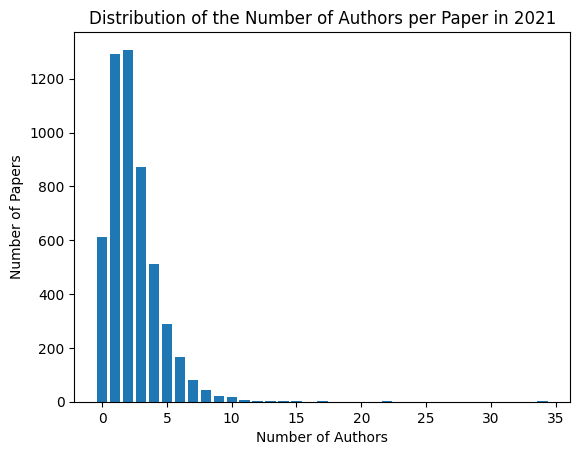

defaultdict(int,
            {4: 513,
             1: 1292,
             3: 871,
             2: 1308,
             0: 612,
             10: 19,
             5: 287,
             6: 166,
             8: 44,
             7: 82,
             9: 22,
             14: 2,
             15: 2,
             22: 1,
             13: 1,
             17: 1,
             12: 4,
             11: 8,
             34: 1})

In [105]:
authors_per_paper(data_2021,year=2021)

In [113]:
G_2021 = build_network_oi(data_2021)

In [115]:
metrics_2021 = get_all_metrics(G_2021)

 Number of Nodes : 7698 - Number of Edges : 16225
 Network Density :0.0005476654044877779
 Average Node Degree :4.215380618342427
 Assortativity Coefficient :0.2738898583892455
 Centrality Coefficients - Degree :{'0000-0002-5974-9476': 0.00038976224503053133, '0000-0002-6162-7443': 0.00038976224503053133, '0000-0002-5480-7454': 0.00038976224503053133, '0000-0002-5008-8042': 0.00038976224503053133, '0000-0003-3276-9335': 0.0002598414966870209, '0000-0001-5055-8481': 0.0002598414966870209, '0000-0003-4710-7721': 0.0002598414966870209, '0000-0003-2867-1175': 0.00038976224503053133, '0000-0002-5459-4313': 0.001429128231778615, '0000-0002-3746-244X': 0.0018188904768091463, '0000-0003-4483-5643': 0.00038976224503053133, '0000-0002-0884-5177': 0.00012992074834351045, '0000-0003-3054-698X': 0.00012992074834351045, '0000-0002-5949-1196': 0.0002598414966870209, '0000-0002-5179-3755': 0.0002598414966870209, '0000-0002-8856-3742': 0.00038976224503053133, '0000-0002-0515-0660': 0.000389762245030531

[3, 3, 3, 3, 2, 2, 2, 3, 11, 14, 3, 1, 1, 2, 2, 3, 3, 2, 1, 1, 3, 1, 4, 1, 2, 2, 2, 5, 5, 9, 18, 60, 9, 14, 9, 31, 9, 21, 60, 23, 8, 23, 4, 4, 2, 2, 2, 2, 4, 7, 5, 5, 5, 5, 13, 5, 11, 12, 12, 6, 20, 5, 7, 7, 7, 7, 7, 7, 7, 7, 7, 1, 5, 1, 5, 5, 5, 9, 5, 5, 2, 6, 1, 1, 9, 5, 2, 7, 16, 6, 6, 6, 7, 6, 7, 6, 4, 4, 4, 4, 4, 3, 3, 4, 3, 6, 6, 6, 11, 6, 6, 6, 2, 2, 2, 2, 2, 5, 2, 1, 5, 16, 8, 8, 5, 5, 3, 3, 5, 5, 4, 7, 13, 2, 2, 7, 8, 4, 4, 4, 4, 3, 3, 3, 4, 2, 2, 2, 1, 6, 1, 1, 3, 11, 3, 7, 2, 8, 2, 10, 1, 1, 1, 1, 1, 1, 5, 4, 10, 15, 24, 7, 2, 2, 2, 13, 6, 10, 4, 4, 4, 2, 2, 2, 1, 8, 5, 5, 5, 5, 5, 9, 4, 4, 4, 4, 1, 1, 2, 3, 4, 1, 1, 11, 4, 7, 2, 6, 5, 1, 3, 3, 3, 4, 2, 2, 2, 10, 10, 7, 10, 7, 7, 12, 10, 10, 10, 3, 6, 2, 2, 2, 3, 17, 2, 2, 2, 2, 3, 2, 2, 2, 2, 8, 15, 8, 15, 19, 8, 8, 8, 8, 5, 5, 3, 1, 1, 1, 2, 19, 2, 1, 3, 3, 3, 5, 3, 2, 9, 2, 5, 1, 1, 1, 1, 1, 2, 2, 2, 1, 7, 1, 17, 3, 2, 7, 1, 1, 6, 2, 4, 4, 2, 2, 2, 3, 3, 4, 4, 8, 6, 4, 5, 9, 2, 2, 2, 10, 1, 1, 4, 20, 5, 1, 2, 5, 5, 1, 1, 

Fitting xmin: 100%|██████████| 39/39 [00:00<00:00, 159.73it/s]
/Users/matilda/.pyenv/versions/3.11.12/lib/python3.11/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,


alpha: 2.752075195312499
xmin: 4.0


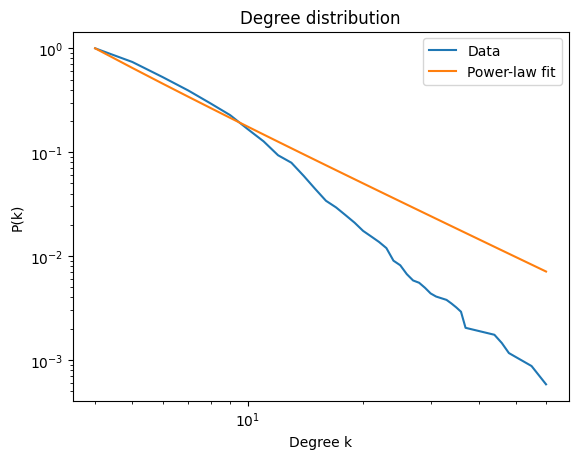

In [116]:
plot_power_law(G_2021)

In [ ]:
top_com_2021 = get_communities(G_2021)

for com in top_com_2021:
        print(len(com)) 

Number of Communities : 1242
231
198
195
160
143


In [118]:
top_k_authors(G_2021)

Ludwig, Arne: 60
Wieck, Aneas Dirk: 60
Watanabe, Kenji: 55
Laucht, Arne: 48
Englund, Dirk: 46


[('0000-0002-2871-7789', 60),
 ('0000-0001-9776-2922', 60),
 ('0000-0003-3701-8119', 55),
 ('0000-0001-7892-7963', 48),
 ('0000-0002-1043-3489', 46)]

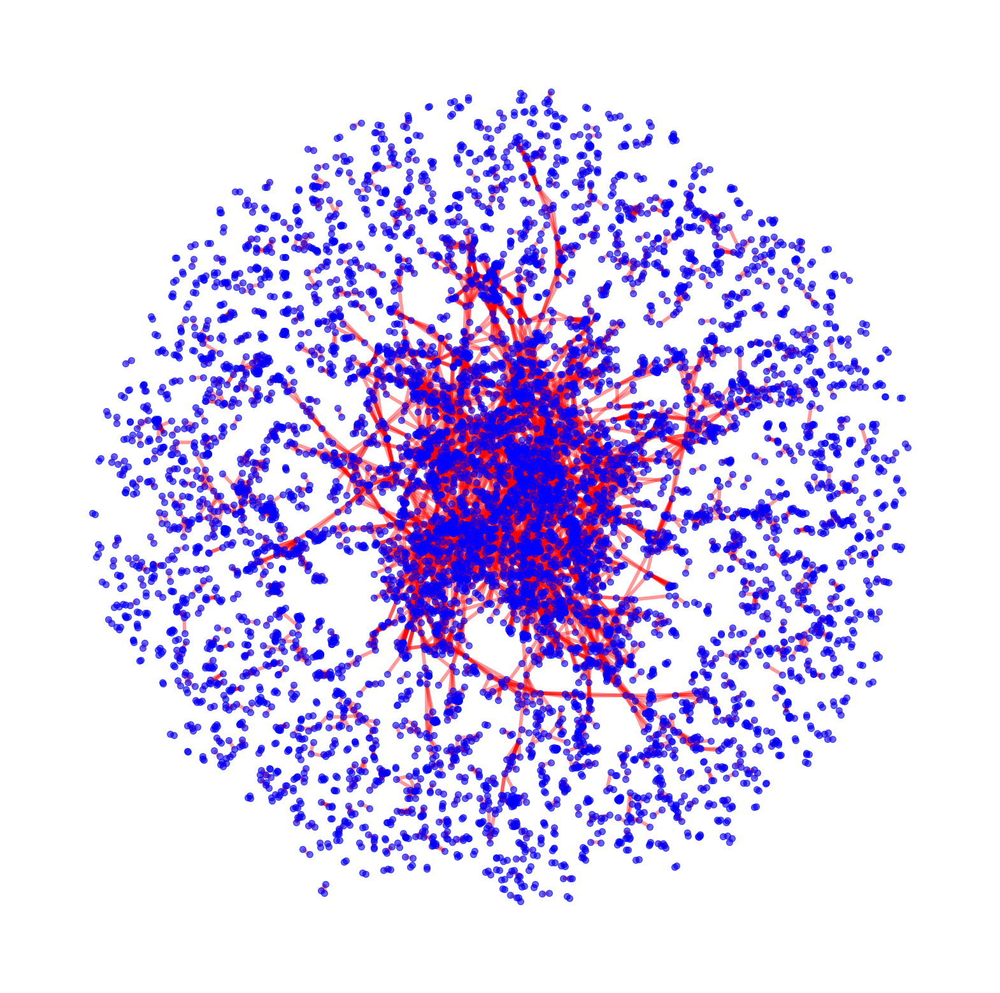

In [212]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(G_2021, seed=42, k=0.3)  

nx.draw_networkx_nodes(
    G_2021, pos,
    node_size=50,
    node_color="blue",
    alpha=0.6
)

nx.draw_networkx_edges(
    G_2021, pos,
    edge_color="red",
    width=4,
    alpha=0.4
)
#plt.title("Scientific Collaboration in Quantum Science and Technologies in 2021")
plt.axis("off")
plt.show()

### Year 2022

59


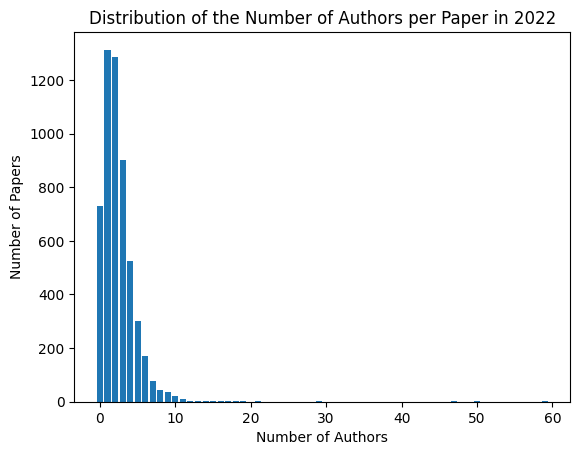

defaultdict(int,
            {1: 1313,
             3: 900,
             0: 731,
             4: 526,
             2: 1285,
             6: 169,
             9: 37,
             5: 300,
             8: 43,
             10: 20,
             7: 77,
             14: 3,
             13: 1,
             11: 12,
             15: 2,
             16: 3,
             50: 1,
             12: 1,
             21: 1,
             17: 1,
             29: 1,
             18: 1,
             59: 1,
             47: 1,
             19: 1})

In [106]:
authors_per_paper(data_2022,2022)

In [119]:
G_2022 = build_network_oi(data_2022)


In [120]:
metrics_2022 = get_all_metrics(G_2022)

 Number of Nodes : 8504 - Number of Edges : 17447
 Network Density :0.00048256445154822784
 Average Node Degree :4.103245531514581
 Assortativity Coefficient :0.26764909901339706
 Centrality Coefficients - Degree :{'0000-0003-0488-8425': 0.0002352111019640127, '0000-0002-5370-9844': 0.0002352111019640127, '0000-0001-7698-2440': 0.0002352111019640127, '0000-0003-1155-7587': 0.0003528166529460191, '0000-0002-7259-3461': 0.0003528166529460191, '0000-0001-7037-2342': 0.0003528166529460191, '0000-0001-9483-8258': 0.0003528166529460191, '0000-0002-7903-4486': 0.00011760555098200635, '0000-0002-9134-3951': 0.0010584499588380573, '0000-0002-2909-0930': 0.0002352111019640127, '0000-0003-1156-3565': 0.0002352111019640127, '0000-0003-1598-8579': 0.0002352111019640127, '0000-0002-2974-0657': 0.0002352111019640127, '0000-0001-5669-5698': 0.0002352111019640127, '0000-0003-2589-3688': 0.0002352111019640127, '0000-0003-0115-8435': 0.0002352111019640127, '0000-0003-1931-0589': 0.0002352111019640127, '0

[2, 2, 2, 3, 3, 3, 3, 1, 9, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 5, 5, 10, 5, 5, 79, 1, 7, 2, 2, 2, 10, 8, 8, 18, 8, 8, 13, 14, 8, 1, 1, 2, 2, 5, 5, 4, 4, 5, 2, 2, 2, 4, 4, 13, 4, 4, 2, 6, 2, 2, 2, 2, 6, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 7, 7, 7, 7, 7, 7, 7, 7, 17, 13, 16, 15, 9, 9, 15, 18, 21, 13, 3, 3, 3, 17, 5, 5, 5, 5, 5, 11, 2, 2, 12, 1, 2, 2, 2, 2, 3, 2, 3, 3, 7, 4, 4, 4, 4, 10, 2, 1, 2, 2, 1, 1, 5, 7, 5, 10, 17, 5, 7, 1, 1, 1, 9, 1, 6, 2, 4, 3, 3, 6, 3, 2, 2, 2, 2, 2, 2, 2, 24, 5, 2, 6, 3, 2, 2, 9, 1, 1, 6, 6, 2, 1, 1, 18, 28, 9, 3, 3, 4, 5, 6, 2, 8, 4, 18, 4, 4, 4, 4, 6, 4, 4, 4, 10, 2, 2, 3, 1, 5, 5, 5, 5, 7, 5, 1, 3, 1, 1, 2, 2, 1, 1, 9, 4, 4, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 8, 9, 12, 8, 13, 8, 5, 1, 2, 1, 3, 10, 3, 6, 6, 9, 1, 3, 2, 5, 2, 2, 2, 2, 14, 9, 4, 4, 4, 11, 11, 6, 6, 11, 6, 6, 2, 2, 2, 2, 3, 2, 4, 5, 4, 5, 4, 4, 4, 4, 4, 4, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 7, 4, 7, 13, 7, 7, 7, 7, 7, 13, 3, 3, 3, 3, 3, 1, 8, 4, 8, 4, 4, 1, 1, 4, 8, 4, 4, 3, 6, 5, 3, 1, 5, 4, 4, 8, 3, 4, 4

Fitting xmin: 100%|██████████| 30/30 [00:00<00:00, 170.24it/s]

alpha: 2.8042236328124996
xmin: 4.0



/Users/matilda/.pyenv/versions/3.11.12/lib/python3.11/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,


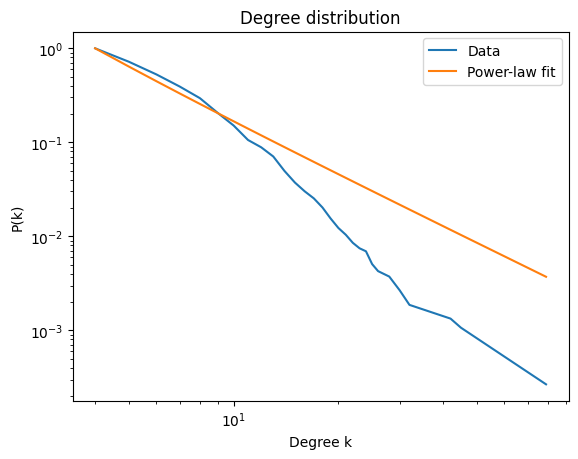

In [121]:
plot_power_law(G_2022)

In [ ]:
top_com_2022 = get_communities(G_2022)
for com in top_com_2022:
        print(len(com))

Number of Communities : 1532
<class 'list'>
184
166
154
149
138
130
124
123
117
115
111
93
89
86
86
78
70
69
59
58
58
56
51
50
49
47
46
45
41
39
39
35
30
30
30
28
27
26
26
25
25
23
23
20
20
20
20
19
18
18
17
17
16
16
16
16
15
15
15
15
15
14
14
14
14
14
14
13
13
13
13
12
12
12
12
12
11
11
11
11
11
11
11
11
10
10
10
10
10
10
10
10
10
10
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
7
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
6
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4

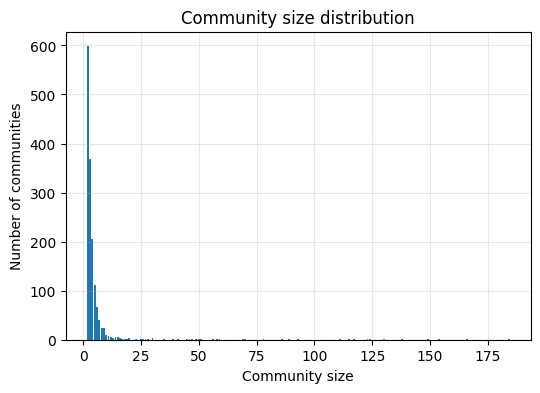

In [229]:
from collections import Counter

community_sizes = [len(com) for com in top_com_2022]
size_counts = Counter(community_sizes)
sizes = sorted(size_counts.keys())
counts = [size_counts[s] for s in sizes]


plt.figure(figsize=(6, 4))
plt.bar(sizes, counts)
plt.xlabel("Community size")
plt.ylabel("Number of communities")
plt.title("Community size distribution")
plt.grid(alpha=0.3)
plt.show()

In [123]:
top_k_authors(G_2022)

Watanabe, Kenji: 79
Wieck, Aneas Dirk: 45
Ludwig, Arne: 45
Johnson, Brett: 45
Nori, Franco: 42


[('0000-0003-3701-8119', 79),
 ('0000-0001-9776-2922', 45),
 ('0000-0002-2871-7789', 45),
 ('0000-0002-2174-4178', 45),
 ('0000-0003-3682-7432', 42)]

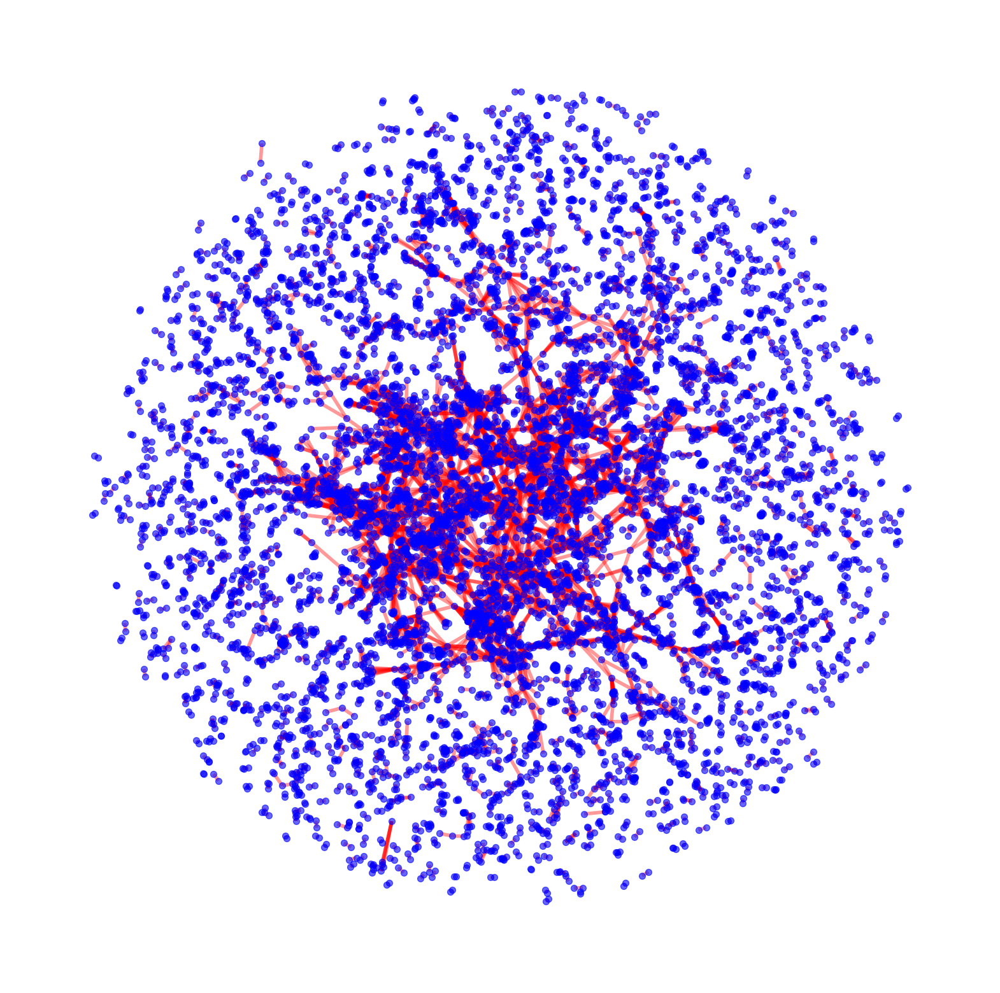

In [238]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(G_2022, seed=42, k=0.3)  

nx.draw_networkx_nodes(
    G_2022, pos,
    node_size=50,
    node_color="blue",
    alpha=0.6
)

nx.draw_networkx_edges(
    G_2022, pos,
    edge_color="red",
    width=4,
    alpha=0.4
)

plt.axis("off")
plt.show()

### Year 2023

18


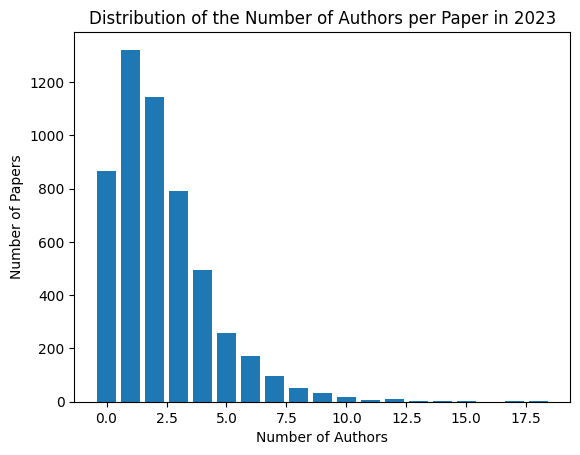

defaultdict(int,
            {0: 865,
             1: 1321,
             9: 33,
             2: 1143,
             3: 789,
             4: 494,
             7: 97,
             5: 258,
             8: 53,
             11: 7,
             15: 3,
             13: 3,
             6: 173,
             12: 11,
             10: 18,
             18: 3,
             17: 1,
             14: 1})

In [107]:
authors_per_paper(data_2023,2023)

In [124]:
G_2023 = build_network_oi(data_2023)

In [125]:
metrics_2023 = get_all_metrics(G_2023)

 Number of Nodes : 8457 - Number of Edges : 17568
 Network Density :0.000491327433153124
 Average Node Degree :4.154664774742817
 Assortativity Coefficient :0.3654722907691264
 Centrality Coefficients - Degree :{'0000-0002-4177-0656': 0.000946073793755913, '0000-0002-0370-0534': 0.0011825922421948912, '0000-0003-4752-0495': 0.001892147587511826, '0000-0001-9774-1507': 0.000946073793755913, '0000-0003-2699-7200': 0.000946073793755913, '0000-0002-1182-0173': 0.000946073793755913, '0000-0002-1948-4434': 0.000946073793755913, '0000-0002-0506-8333': 0.0021286660359508044, '0000-0001-9280-7431': 0.000946073793755913, '0000-0002-8573-1675': 0.0005912961210974456, '0009-0001-7907-2933': 0.00011825922421948912, '0000-0002-0935-2294': 0.00023651844843897824, '0000-0002-2523-1409': 0.00023651844843897824, '0000-0001-9269-4705': 0.00023651844843897824, '0000-0002-6559-1513': 0.00023651844843897824, '0000-0003-1136-2536': 0.00023651844843897824, '0000-0003-4695-5526': 0.00023651844843897824, '0000-

[8, 10, 16, 8, 8, 8, 8, 18, 8, 5, 1, 2, 2, 2, 2, 2, 2, 3, 1, 5, 1, 3, 7, 16, 4, 3, 3, 3, 3, 12, 4, 1, 1, 3, 3, 4, 9, 6, 6, 6, 6, 6, 10, 6, 1, 1, 2, 2, 2, 4, 4, 4, 64, 4, 1, 2, 7, 7, 7, 7, 7, 7, 7, 7, 1, 1, 2, 2, 2, 3, 3, 3, 16, 4, 4, 4, 4, 4, 1, 4, 1, 1, 6, 6, 11, 11, 6, 6, 11, 1, 1, 1, 1, 1, 1, 2, 2, 2, 8, 3, 4, 3, 2, 2, 4, 2, 2, 2, 10, 10, 16, 10, 10, 10, 12, 10, 10, 12, 10, 1, 1, 3, 3, 3, 3, 1, 1, 3, 3, 3, 14, 21, 35, 14, 35, 14, 19, 15, 19, 14, 14, 21, 19, 14, 19, 1, 1, 1, 11, 2, 2, 16, 4, 5, 4, 15, 10, 12, 12, 12, 12, 12, 12, 13, 12, 12, 12, 12, 12, 12, 3, 3, 3, 26, 6, 4, 2, 1, 1, 8, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 1, 3, 20, 2, 6, 1, 1, 2, 2, 2, 3, 8, 3, 3, 2, 5, 2, 5, 5, 10, 5, 5, 5, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 3, 3, 6, 3, 3, 3, 3, 5, 5, 6, 6, 6, 5, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 7, 7, 15, 19, 13, 13, 13, 7, 2, 2, 2, 6, 2, 2, 7, 2, 2, 15, 6, 6, 3, 2, 4, 2, 2, 7, 3, 8, 3, 8, 1, 1, 4, 4, 4, 4, 10, 11, 5, 5, 2, 5, 5, 7, 7, 8, 8, 8, 7, 8, 7, 10, 2, 2, 

Fitting xmin: 100%|██████████| 33/33 [00:00<00:00, 183.71it/s]

alpha: 2.794921874999999
xmin: 4.0



/Users/matilda/.pyenv/versions/3.11.12/lib/python3.11/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,


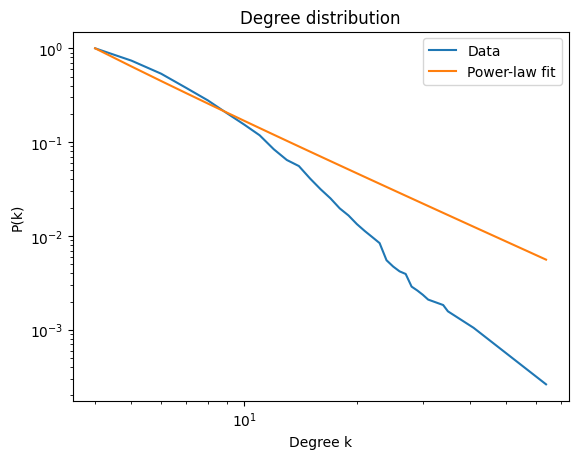

In [126]:
plot_power_law(G_2023)

In [127]:
top_com_2023 = get_communities(G_2023)

for com in top_com_2023:
        print(len(com))

Number of Communities : 1601
151
142
139
130
121


In [128]:
top_k_authors(G_2023)

Watanabe, Kenji: 64
Ludwig, Arne: 41
Wieck, Aneas Dirk: 41
Scappucci, Giordano: 41
Ligi, Carlo: 35


[('0000-0003-3701-8119', 64),
 ('0000-0002-2871-7789', 41),
 ('0000-0001-9776-2922', 41),
 ('0000-0003-2512-0079', 41),
 ('0000-0001-7943-7704', 35)]

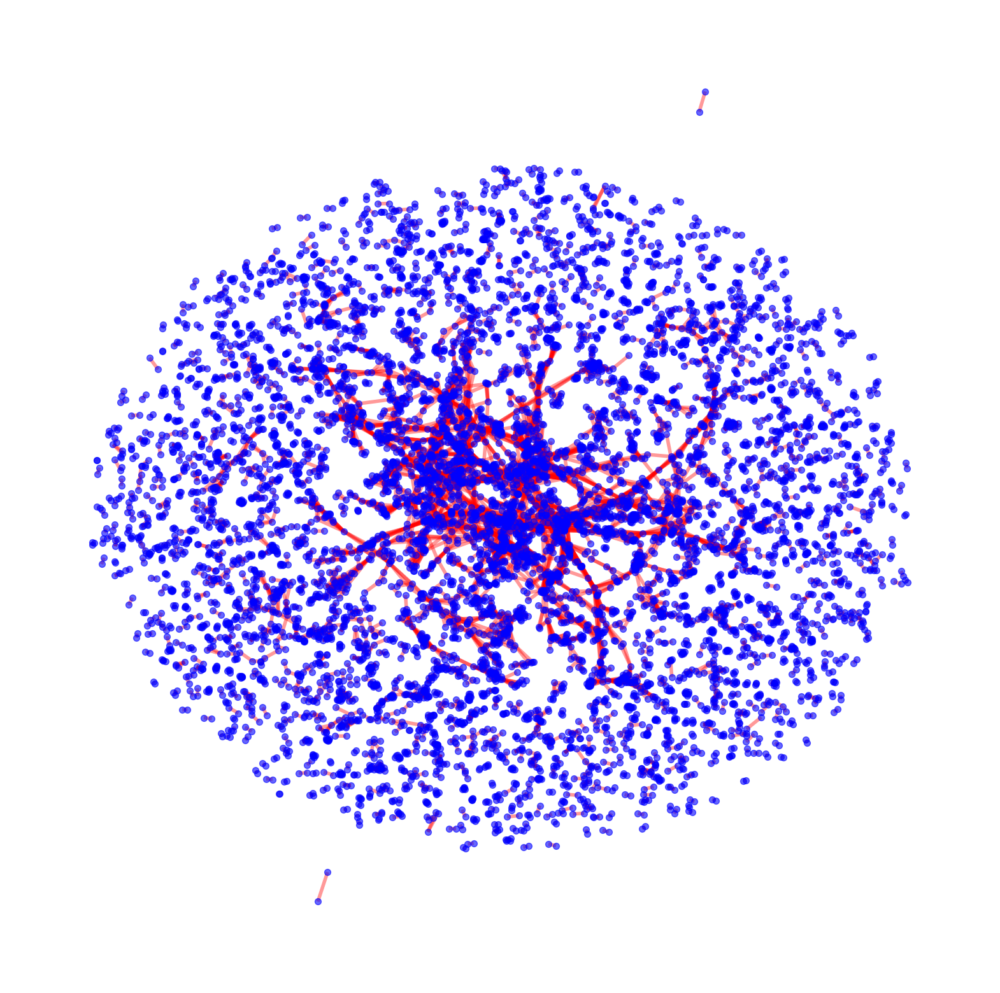

In [239]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(G_2023, seed=42, k=0.3)  

nx.draw_networkx_nodes(
    G_2023, pos,
    node_size=50,
    node_color="blue",
    alpha=0.6
)

nx.draw_networkx_edges(
    G_2023, pos,
    edge_color="red",
    width=4,
    alpha=0.4
)

plt.axis("off")
plt.show()

### Year 2024

756


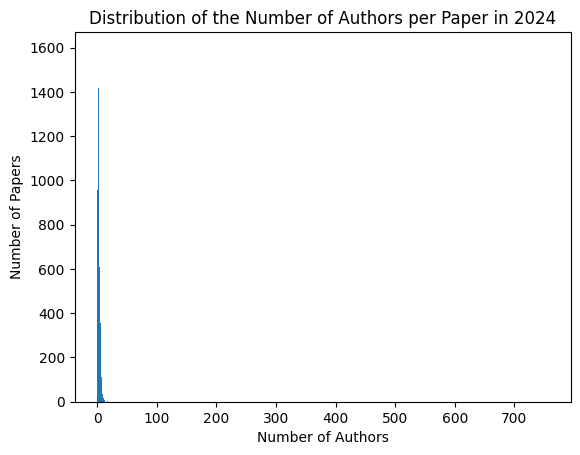

defaultdict(int,
            {1: 1591,
             2: 1416,
             0: 959,
             4: 611,
             6: 193,
             3: 1022,
             9: 35,
             8: 68,
             5: 357,
             17: 4,
             7: 113,
             13: 5,
             12: 7,
             11: 14,
             27: 1,
             10: 17,
             16: 1,
             23: 2,
             756: 1,
             21: 1,
             15: 2,
             19: 1,
             26: 1,
             460: 1,
             14: 1})

In [108]:
authors_per_paper(data_2024,2024)

In [129]:
G_2024 = build_network_oi(data_2024)

In [130]:
metrics_2024 = get_all_metrics(G_2024)

 Number of Nodes : 10436 - Number of Edges : 21105
 Network Density :0.0003876045159369644
 Average Node Degree :4.044653123802223
 Assortativity Coefficient :0.41371861978441793
 Centrality Coefficients - Degree :{'0009-0004-8050-0431': 0.0006708193579300432, '0000-0002-6575-2479': 9.583133684714902e-05, '0000-0003-4574-3708': 0.00028749401054144706, '0000-0002-1521-8729': 0.00028749401054144706, '0000-0002-5345-7210': 0.00028749401054144706, '0000-0002-1045-8168': 0.00028749401054144706, '0000-0001-5219-6840': 9.583133684714902e-05, '0000-0001-6614-9391': 9.583133684714902e-05, '0000-0002-0207-6901': 0.00028749401054144706, '0000-0003-2106-8613': 0.00028749401054144706, '0000-0002-2417-350X': 0.00028749401054144706, '0000-0002-0412-0566': 0.0003833253473885961, '0000-0002-0273-3457': 9.583133684714902e-05, '0000-0002-4553-1214': 9.583133684714902e-05, '0000-0002-8968-8870': 0.0007666506947771922, '0000-0003-4152-4284': 0.0007666506947771922, '0000-0001-9941-3363': 0.00114997604216578

[7, 1, 3, 3, 3, 3, 1, 1, 3, 3, 3, 4, 1, 1, 8, 8, 12, 5, 5, 11, 3, 3, 3, 5, 5, 11, 5, 5, 5, 17, 8, 8, 8, 8, 8, 8, 8, 16, 1, 14, 29, 4, 4, 3, 2, 1, 1, 1, 7, 10, 9, 9, 7, 7, 7, 7, 9, 3, 7, 3, 4, 4, 4, 6, 5, 5, 5, 5, 5, 5, 12, 1, 1, 4, 4, 4, 4, 6, 1, 1, 2, 2, 2, 2, 3, 3, 2, 2, 2, 7, 6, 6, 8, 9, 9, 6, 1, 1, 1, 1, 1, 1, 2, 2, 2, 4, 4, 5, 4, 4, 3, 3, 3, 3, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 5, 6, 11, 2, 5, 6, 1, 2, 2, 2, 1, 1, 2, 2, 2, 24, 1, 2, 2, 2, 3, 3, 3, 3, 8, 3, 5, 2, 2, 2, 2, 4, 2, 3, 5, 6, 1, 1, 2, 2, 2, 5, 5, 5, 5, 5, 5, 2, 2, 2, 1, 4, 6, 2, 6, 3, 3, 3, 3, 4, 4, 4, 3, 3, 17, 3, 3, 5, 1, 1, 4, 4, 4, 4, 4, 1, 1, 1, 1, 16, 3, 3, 3, 3, 3, 4, 3, 1, 4, 3, 3, 17, 9, 4, 2, 4, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 4, 1, 1, 6, 6, 6, 6, 6, 6, 6, 1, 1, 9, 1, 1, 1, 3, 3, 3, 3, 8, 6, 6, 6, 8, 6, 6, 3, 1, 6, 10, 6, 6, 6, 6, 6, 1, 1, 1, 1, 2, 2, 2, 2, 7, 2, 4, 4, 4, 8, 4, 4, 4, 4, 1, 2, 2, 2, 7, 1, 2, 5, 2, 2, 2, 2, 5, 9, 12, 17, 8, 15, 9, 9, 16, 9, 9, 17, 2, 3, 8, 3, 4, 3, 3, 2, 2, 2, 4, 4, 4, 4

Fitting xmin: 100%|██████████| 30/30 [00:00<00:00, 189.31it/s]

alpha: 2.8746826171874993
xmin: 4.0



/Users/matilda/.pyenv/versions/3.11.12/lib/python3.11/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,


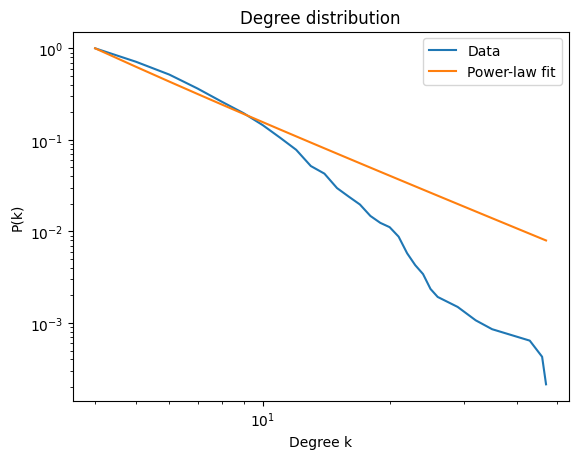

In [131]:
plot_power_law(G_2024)

In [132]:
top_com_2024 = get_communities(G_2024)

for com in top_com_2024:
        print(len(com))

Number of Communities : 1975
168
144
124
110
104


In [133]:
top_k_authors(G_2024)

Ludwig, Arne: 47
Wieck, Aneas Dirk: 46
Watanabe, Kenji: 43
Heremans, F Joseph: 35
Lemaitre, Aristide: 32


[('0000-0002-2871-7789', 47),
 ('0000-0001-9776-2922', 46),
 ('0000-0003-3701-8119', 43),
 ('0000-0003-3337-7958', 35),
 ('0000-0003-1892-9726', 32)]

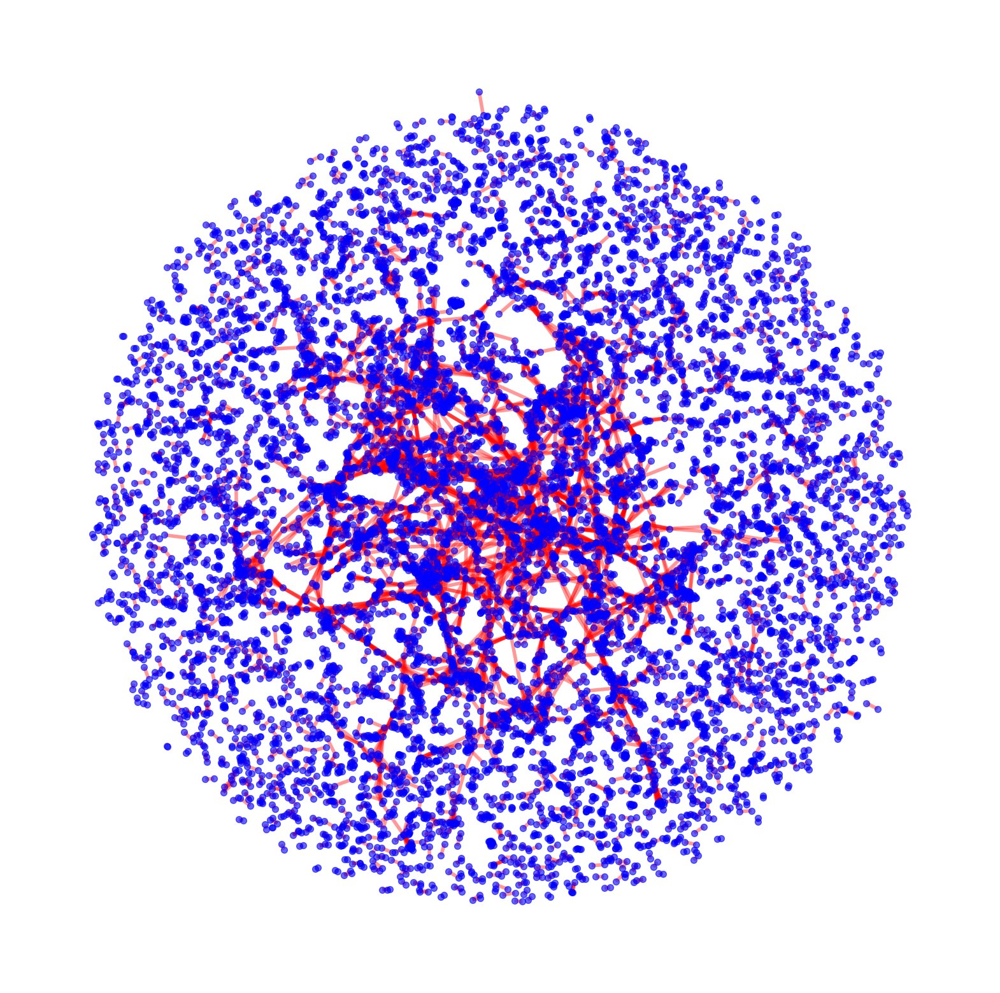

In [240]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(G_2024, seed=42, k=0.3)  

nx.draw_networkx_nodes(
    G_2024, pos,
    node_size=50,
    node_color="blue",
    alpha=0.6
)

nx.draw_networkx_edges(
    G_2024, pos,
    edge_color="red",
    width=4,
    alpha=0.4
)

plt.axis("off")
plt.show()

### Year 2025

62


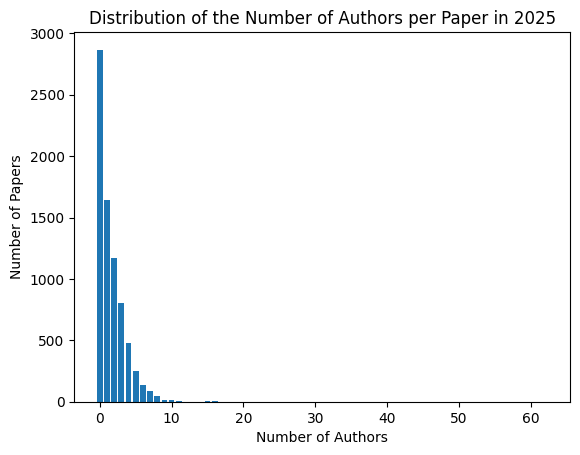

defaultdict(int,
            {1: 1640,
             2: 1173,
             0: 2867,
             3: 807,
             4: 479,
             6: 140,
             7: 84,
             8: 43,
             9: 12,
             5: 249,
             13: 1,
             10: 15,
             11: 3,
             15: 2,
             62: 1,
             26: 1,
             18: 1,
             16: 2,
             14: 1})

In [109]:
authors_per_paper(data_2025,2025)

In [134]:
G_2025 = build_network_oi(data_2025)

In [135]:
metrics_2025 = get_all_metrics(G_2025)

 Number of Nodes : 8172 - Number of Edges : 14883
 Network Density :0.0004457762320128257
 Average Node Degree :3.642437591776799
 Assortativity Coefficient :0.40394470790251746
 Centrality Coefficients - Degree :{'0000-0001-8812-2114': 0.00012238404112103782, '0000-0002-7578-8811': 0.00012238404112103782, '0009-0009-8267-6226': 0.00012238404112103782, '0000-0001-9365-8167': 0.00012238404112103782, '0009-0007-7226-7053': 0.00024476808224207564, '0000-0003-2115-1847': 0.0004895361644841513, '0009-0007-5654-5412': 0.0003671521233631135, '0000-0002-4339-1027': 0.0003671521233631135, '0000-0001-5511-2083': 0.0003671521233631135, '0000-0002-2749-4739': 0.0003671521233631135, '0009-0006-2639-0280': 0.000734304246726227, '0000-0003-4220-5592': 0.00024476808224207564, '0000-0001-9838-6631': 0.00024476808224207564, '0000-0002-7248-664X': 0.00024476808224207564, '0000-0002-7550-4065': 0.0006119202056051891, '0000-0001-5239-1849': 0.001468608493452454, '0000-0003-1374-7851': 0.0006119202056051891

[1, 1, 1, 1, 2, 4, 3, 3, 3, 3, 6, 2, 2, 2, 5, 12, 5, 5, 5, 5, 3, 3, 3, 3, 3, 3, 11, 17, 3, 1, 2, 2, 3, 6, 6, 8, 6, 6, 15, 6, 1, 1, 3, 1, 6, 6, 6, 6, 11, 6, 6, 3, 5, 3, 3, 7, 7, 7, 7, 8, 7, 7, 7, 2, 2, 1, 1, 1, 1, 3, 5, 1, 1, 2, 4, 4, 5, 5, 5, 5, 12, 5, 8, 8, 8, 8, 8, 8, 8, 8, 8, 5, 6, 9, 6, 10, 5, 5, 6, 5, 5, 5, 2, 2, 2, 3, 3, 8, 4, 2, 2, 2, 4, 4, 4, 4, 4, 3, 3, 5, 3, 4, 5, 2, 2, 2, 2, 1, 1, 2, 2, 4, 3, 3, 6, 6, 2, 2, 5, 1, 1, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 3, 3, 3, 6, 6, 6, 6, 6, 6, 6, 6, 2, 2, 2, 1, 1, 3, 3, 3, 3, 1, 4, 4, 6, 1, 1, 2, 4, 2, 1, 1, 1, 1, 2, 3, 3, 10, 6, 9, 13, 6, 11, 6, 3, 8, 3, 3, 8, 5, 5, 5, 8, 5, 1, 1, 2, 2, 2, 2, 2, 2, 20, 9, 9, 5, 5, 9, 1, 1, 1, 1, 1, 1, 2, 2, 2, 7, 7, 7, 7, 7, 7, 7, 7, 2, 6, 2, 4, 4, 4, 4, 4, 3, 1, 2, 2, 4, 2, 2, 2, 3, 3, 3, 6, 1, 1, 3, 3, 3, 3, 2, 2, 2, 3, 3, 3, 3, 3, 6, 6, 3, 1, 1, 2, 57, 12, 3, 3, 3, 3, 5, 5, 5, 9, 5, 5, 2, 8, 2, 3, 3, 3, 3, 4, 6, 4, 6, 4, 3, 5, 3, 12, 2, 2, 2, 1, 10, 1, 1, 2, 2, 3, 2, 2, 2, 5, 5, 5, 6, 5,

Fitting xmin: 100%|██████████| 22/22 [00:00<00:00, 158.54it/s]

alpha: 2.653564453124999
xmin: 3.0



/Users/matilda/.pyenv/versions/3.11.12/lib/python3.11/site-packages/powerlaw/distributions.py:743: OptimizeWarning: Initial guess is not within the specified bounds
  result = scipy.optimize.minimize(fit_function,


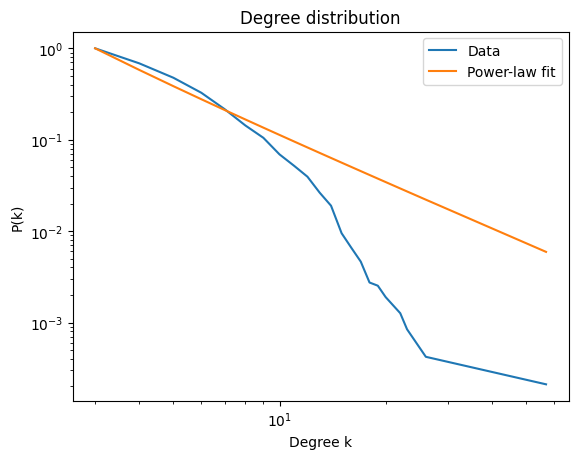

In [136]:
plot_power_law(G_2025)

In [137]:
top_com_2025 = get_communities(G_2025)

for com in top_com_2025:
        print(len(com))

Number of Communities : 1743
163
110
101
95
91


In [138]:
top_k_authors(G_2025)

Watanabe, Kenji: 57
Rastelli, Armando: 26
Jakob, Alexander Malwin: 23
MAGNIFICO, GIUSEPPE: 23
Wieck, Aneas Dirk: 22


[('0000-0003-3701-8119', 57),
 ('0000-0002-1343-4962', 26),
 ('0000-0002-2794-404X', 23),
 ('0000-0002-7280-445X', 23),
 ('0000-0001-9776-2922', 22)]

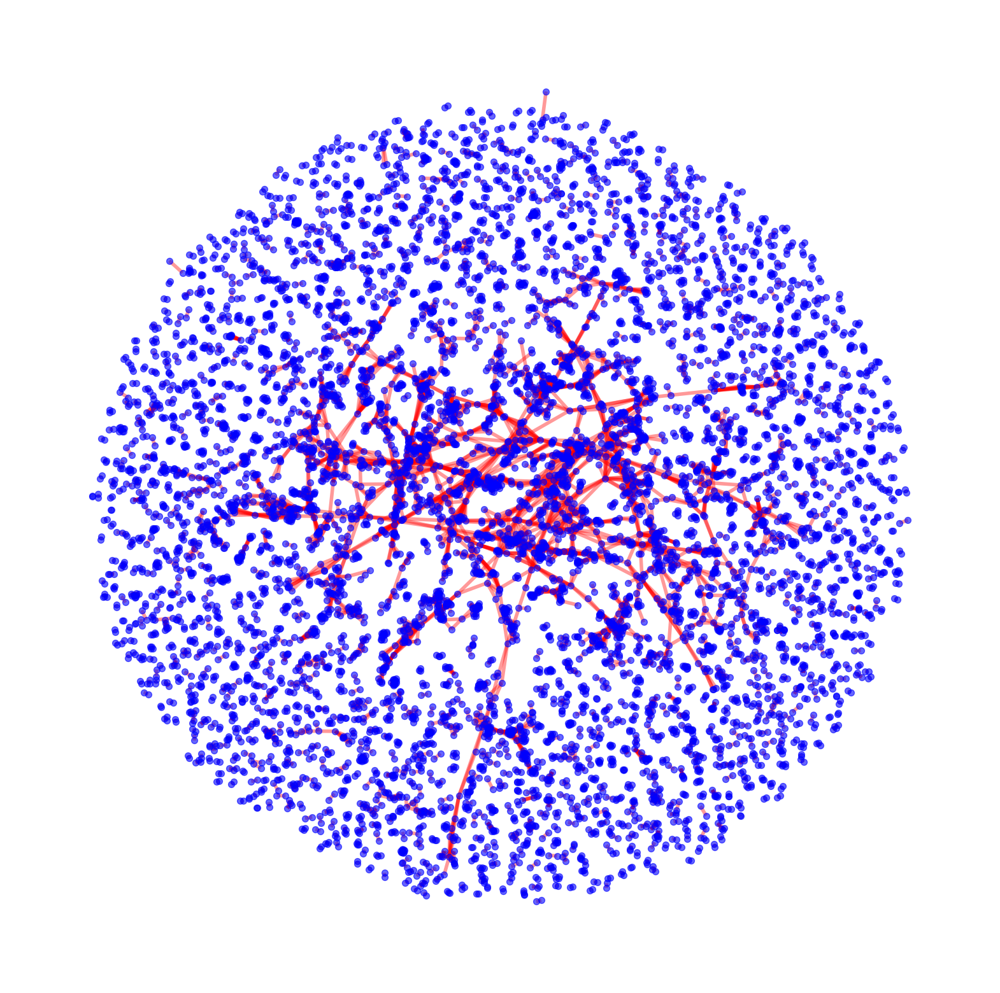

In [241]:
plt.figure(figsize=(20, 20))

pos = nx.spring_layout(G_2025, seed=42, k=0.3)  

nx.draw_networkx_nodes(
    G_2025, pos,
    node_size=50,
    node_color="blue",
    alpha=0.6
)

nx.draw_networkx_edges(
    G_2025, pos,
    edge_color="red",
    width=4,
    alpha=0.4
)

plt.axis("off")
plt.show()

## 4. Temporal analysis of Communities

In [ ]:
from collections import Counter

counter = Counter()
top5_per_year = {"2021":top_com_2021,"2022":top_com_2022,"2023":top_com_2023,"2024":top_com_2024,"2025":top_com_2025}

for year, communities in top5_per_year.items():
    for comm in communities:
        counter.update(set(comm))  # avoid double-counting within year

# nodes appearing in top communities in ALL years
stable_nodes = [
    node for node, count in counter.items()
    if count > 4
]

print(len(stable_nodes))
print(stable_nodes)

1
['0000-0002-7130-6723']


In [242]:
def jaccard(a, b): 
    return len(a & b) / len(a | b) 
community_tracking = {} 
years = sorted(top5_per_year.keys()) 
for y_prev, y_curr in zip(years[:-1], years[1:]): 
    matches = [] 
    for i, comm_prev in enumerate(top5_per_year[y_prev]): 
        for j, comm_curr in enumerate(top5_per_year[y_curr]): 
            score = jaccard(set(comm_prev), set(comm_curr)) 
            matches.append((i, j, score)) # best match per previous community 
            best_matches = sorted(matches, key=lambda x: x[2], reverse=True) 
            community_tracking[(y_prev, y_curr)] = best_matches[:5]

In [243]:
print(community_tracking)

{('2021', '2022'): [(0, 1, 0.05585106382978723), (0, 3, 0.02981029810298103), (2, 0, 0.01881720430107527), (2, 3, 0.01775147928994083), (2, 2, 0.01749271137026239)], ('2022', '2023'): [(3, 1, 0.05434782608695652), (0, 1, 0.05161290322580645), (0, 2, 0.045307443365695796), (1, 3, 0.01718213058419244), (3, 4, 0.015037593984962405)], ('2023', '2024'): [(1, 4, 0.1031390134529148), (4, 1, 0.04743083003952569), (2, 3, 0.04184100418410042), (2, 0, 0.009868421052631578), (3, 4, 0.008620689655172414)], ('2024', '2025'): [(3, 1, 0.06280193236714976), (2, 3, 0.0330188679245283), (4, 0, 0.022988505747126436), (0, 1, 0.014598540145985401), (1, 2, 0.012396694214876033)]}


In [244]:
latex_str = ""

for (y_prev, y_curr), matches in community_tracking.items():
    latex_str += f"%% Table for {y_prev} → {y_curr}\n"
    latex_str += "\\begin{table}[h!]\n\\centering\n"
    latex_str += f"\\caption{{Community overlaps from {y_prev} to {y_curr}}}\n"
    latex_str += "\\begin{tabular}{c c c}\n"
    latex_str += "\\hline\n"
    latex_str += "Prev Community & Curr Community & Jaccard \\\\\n"
    latex_str += "\\hline\n"
    for i, j, score in matches:
        latex_str += f"{i} & {j} & {score:.3f} \\\\\n"
    latex_str += "\\hline\n"
    latex_str += "\\end{tabular}\n"
    latex_str += "\\end{table}\n\n"

print(latex_str)


%% Table for 2021 → 2022
\begin{table}[h!]
\centering
\caption{Community overlaps from 2021 to 2022}
\begin{tabular}{c c c}
\hline
Prev Community & Curr Community & Jaccard \\
\hline
0 & 1 & 0.056 \\
0 & 3 & 0.030 \\
2 & 0 & 0.019 \\
2 & 3 & 0.018 \\
2 & 2 & 0.017 \\
\hline
\end{tabular}
\end{table}

%% Table for 2022 → 2023
\begin{table}[h!]
\centering
\caption{Community overlaps from 2022 to 2023}
\begin{tabular}{c c c}
\hline
Prev Community & Curr Community & Jaccard \\
\hline
3 & 1 & 0.054 \\
0 & 1 & 0.052 \\
0 & 2 & 0.045 \\
1 & 3 & 0.017 \\
3 & 4 & 0.015 \\
\hline
\end{tabular}
\end{table}

%% Table for 2023 → 2024
\begin{table}[h!]
\centering
\caption{Community overlaps from 2023 to 2024}
\begin{tabular}{c c c}
\hline
Prev Community & Curr Community & Jaccard \\
\hline
1 & 4 & 0.103 \\
4 & 1 & 0.047 \\
2 & 3 & 0.042 \\
2 & 0 & 0.010 \\
3 & 4 & 0.009 \\
\hline
\end{tabular}
\end{table}

%% Table for 2024 → 2025
\begin{table}[h!]
\centering
\caption{Community overlaps from 2024 to

In [ ]:
max(top_com_2021)

In [172]:
giant_comp = metrics_2021["giant component"]
nodes_2021=set(giant_comp.nodes)

In [174]:
giant_comp_2022 = metrics_2022["giant component"]
nodes_2022=set(giant_comp_2022.nodes)



In [217]:
giant_comp_2023 = metrics_2023["giant component"]
nodes_2023=set(giant_comp_2023.nodes)

In [218]:
giant_comp_2024 = metrics_2024["giant component"]
nodes_2024=set(giant_comp_2024.nodes)

In [219]:
giant_comp_2025 = metrics_2025["giant component"]
nodes_2025=set(giant_comp_2025.nodes)

In [221]:
print(jaccard(nodes_2021,nodes_2022))
intersect_2021_22 = nodes_2021&nodes_2022
print(jaccard(intersect_2021_22,nodes_2023))
intersect_2021_22_23 = intersect_2021_22&nodes_2023
print(jaccard(intersect_2021_22_23,nodes_2024))
intersect_2021_22_23_24 = intersect_2021_22_23&nodes_2024
print(jaccard(intersect_2021_22_23_24,nodes_2025))

0.18112820512820513
0.10962901208837016
0.04614767255216693
0.024727992087042534


## 5. Visualisation 

In [204]:
def extract_orcids(oi_str):
    if not isinstance(oi_str, str):
        return set()
    return set(re.findall(r"\d{4}-\d{4}-\d{4}-\d{4}", oi_str))

data_2021["ORCIDs"] = data_2021["OI"].apply(extract_orcids)
data_2022["ORCIDs"] = data_2022["OI"].apply(extract_orcids)
data_2023["ORCIDs"] = data_2023["OI"].apply(extract_orcids)
data_2024["ORCIDs"] = data_2024["OI"].apply(extract_orcids)
data_2025["ORCIDs"] = data_2025["OI"].apply(extract_orcids)

/var/folders/pf/ytvvhsyj6r5gstp_1_y4f0v00000gp/T/ipykernel_71529/44338453.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_2021["ORCIDs"] = data_2021["OI"].apply(extract_orcids)
/var/folders/pf/ytvvhsyj6r5gstp_1_y4f0v00000gp/T/ipykernel_71529/44338453.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_2022["ORCIDs"] = data_2022["OI"].apply(extract_orcids)
/var/folders/pf/ytvvhsyj6r5gstp_1_y4f0v00000gp/T/ipykernel_71529/44338453.py:8: SettingWithCopyWarning: 
A value is trying to be set on a co

In [182]:
data_2021["ORCIDs"].iloc[0]

{'0000-0002-5008-8042',
 '0000-0002-5480-7454',
 '0000-0002-5974-9476',
 '0000-0002-6162-7443'}

In [200]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordcloud(text, title=None):
    wc = WordCloud(
        width=800,
        height=400,
        background_color="white",
        stopwords="english",
        max_words=100
    ).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wc)
    plt.axis("off")
    if title:
        plt.title(title)
    plt.show()

def community_papers(df, community_orcids):
    return df[df["ORCIDs"].apply(lambda x: len(x & community_orcids) > 0)]

def community_text(df, community_orcids, text_col="abstract"):
    papers = community_papers(df, community_orcids)
    return " ".join(papers[text_col])



In [201]:
text= community_text(data_2021, top_com_2021[0])
print(text)

Epitaxially grown superconductor/dielectric/superconductor trilayers have the potential to form high-performance superconducting quantum devices and may even allow scalable superconducting quantum computing with low-surface-area qubits such as the merged-element transmon. In this work, we measure the power-independent loss and two-level-state (TLS) loss of epitaxial, wafer-bonded, and substrate-removed Al/GaAs/Al trilayers by measuring lumped element superconducting microwave resonators at millikelvin temperatures and down to single-photon powers. The power-independent loss of the device is ( 4.8 +/- 0.1 ) x 10 - 5, and the resonator-induced intrinsic TLS loss is ( 6.4 +/- 0.2 ) x 10 - 5. Dielectric loss extraction is used to determine a lower bound of the intrinsic TLS loss of the trilayer of 7.2 x 10 - 5. The unusually high power-independent loss is attributed to GaAs's intrinsic piezoelectricity. Single-shot readout of charge and spin states by charge sensors such as quantum point c

In [234]:
text= community_text(data_2022, top_com_2022[0])
print(text)

Quantum parameter estimation offers solid conceptual grounds for the design of sensors enjoying quantum advantage. This is realised not only by means of hardware supporting and exploiting quantum properties, but data analysis has its impact and relevance, too. In this respect, Bayesian methods have emerged as an effective and elegant solution, with the perk of incorporating naturally the availability of a priori information. In this article we present an evaluation of Bayesian methods for multiple phase estimation, assessed based on bounds that work beyond the usual limit of large samples assumed in parameter estimation. Importantly, such methods are applied to experimental data generated from the output statistics of a three-arm interferometer seeded by single photons. Our studies provide a blueprint for a more comprehensive data analysis in quantum metrology. A novel study on harmonic frequency combs emitted by quantum cascade lasers (QCLs) is presented here, demonstrating the presen

In [235]:
text= community_text(data_2023, top_com_2023[0])
print(text)

Quantum illumination uses quantum correlations to provide an enhanced detection of an object in the presence of background noise. This advantage has been shown to exist even if one uses nonoptimal direct measurements on the two correlated modes. Here we present a protocol that mimics the behavior of quantum illumination, but does not use correlated or entangled modes. Instead, the protocol uses coherent (or phase-randomized coherent) pulses with randomly chosen intensities. The intensities are drawn from a distribution such that the average state looks thermal. Under appropriate conditions, the mimic protocol can perform similarly to quantum illumination schemes that use direct measurements. This holds even for a reflectance as low as 10-7. We also present an analytic condition which allows one to determine the sets of parameters in which each protocol works best. Two-dimensional magnets and superconductors are emerging as tunable building-blocks for quantum computing and superconducti

In [236]:
text= community_text(data_2024, top_com_2024[0])
print(text)

Hole spins in Ge/SiGe heterostructures have emerged as an interesting qubit platform with favourable properties such as fast electrical control and noise-resilient operation at sweet spots. However, commonly observed gate-induced electrostatic disorder, drifts, and hysteresis hinder reproducible tune-up of SiGe-based quantum dot arrays. Here, we study Hall bar and quantum dot devices fabricated on Ge/SiGe heterostructures and present a consistent model for the origin of gate hysteresis and its impact on transport metrics and charge noise. As we push the accumulation voltages more negative, we observe non-monotonous changes in the low-density transport metrics, attributed to the induced gradual filling of a spatially varying density of charge traps at the SiGe-oxide interface. With each gate voltage push, we find local activation of a transient low-frequency charge noise component that completely vanishes again after 30 hours. Our results highlight the resilience of the SiGe material pl

In [237]:
text= community_text(data_2025, top_com_2025[0])
print(text)

With recent progress in quantum simulations of lattice-gauge theories, it is becoming a pressing question how to reliably protect the gauge symmetry that defines such models. Recently, an experimentally feasible gauge-protection scheme has been proposed that is based on the concept of a local pseudogenerator, which is required to act identically to the full gauge-symmetry generator in the target gauge sector, but not necessarily outside of it. The scheme has been analytically and numerically shown to reliably stabilize lattice gauge theories in the presence of perturbative errors on finite-size analog quantum-simulation devices. In this work, through uniform matrix product state calculations, we demonstrate the efficacy of this scheme for nonperturbative errors in analog quantum simulators up to all accessible evolution times in the thermodynamic limit, where it is a priori neither established nor expected that this scheme will succeed. Our results indicate the presence of an emergent 

In [214]:
metrics_by_year = {
    2021: {
        "avg_degree": metrics_2021["node degree"],
        "avg_path_length": metrics_2021["shortest path length in giant component"],
        "clustering": metrics_2021["clustering"],
        "assortativity": metrics_2021["assortativity"],
    },
    2022: {
        "avg_degree": metrics_2022["node degree"],
        "avg_path_length": metrics_2022["shortest path length in giant component"],
        "clustering": metrics_2022["clustering"],
        "assortativity": metrics_2022["assortativity"],
    },
    2023:{
        "avg_degree": metrics_2023["node degree"],
        "avg_path_length": metrics_2023["shortest path length in giant component"],
        "clustering": metrics_2023["clustering"],
        "assortativity": metrics_2023["assortativity"],
    },
    2024:{
        "avg_degree": metrics_2024["node degree"],
        "avg_path_length": metrics_2024["shortest path length in giant component"],
        "clustering": metrics_2024["clustering"],
        "assortativity": metrics_2024["assortativity"],
    },
    2025:{"avg_degree": metrics_2025["node degree"],
        "avg_path_length": metrics_2025["shortest path length in giant component"],
        "clustering": metrics_2025["clustering"],
        "assortativity": metrics_2025["assortativity"],}

}

In [215]:
years = sorted(metrics_by_year.keys())

avg_degree = [metrics_by_year[y]["avg_degree"] for y in years]
avg_path   = [metrics_by_year[y]["avg_path_length"] for y in years]
clustering = [metrics_by_year[y]["clustering"] for y in years]
assort     = [metrics_by_year[y]["assortativity"] for y in years]


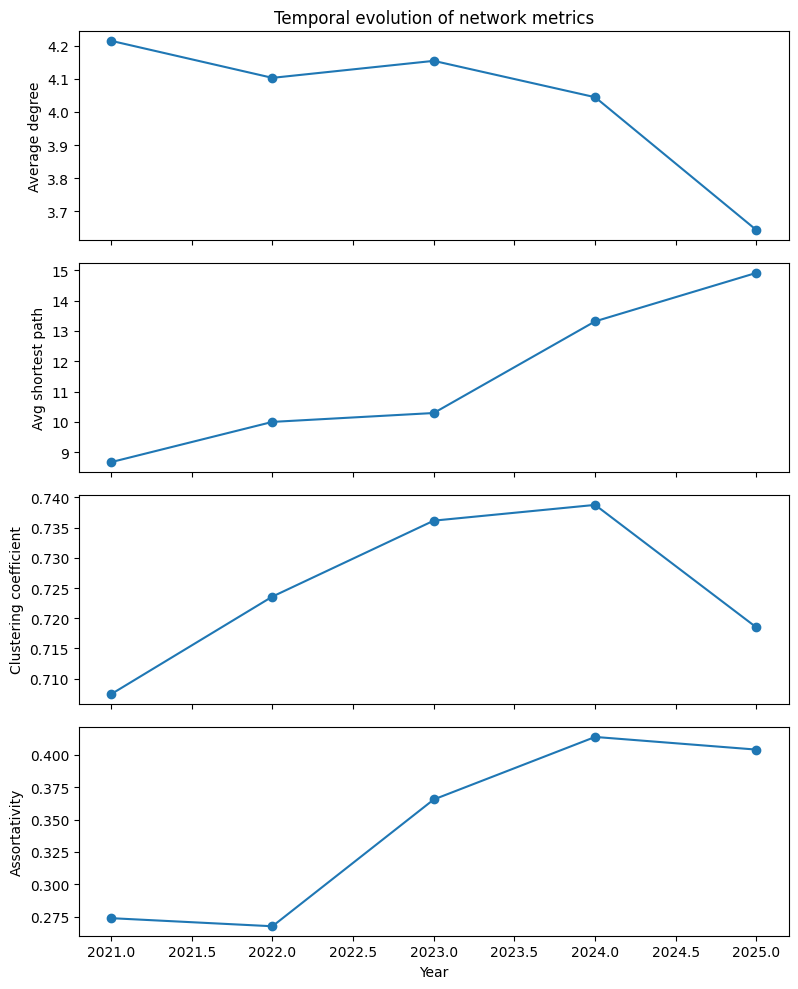

In [216]:
fig, axes = plt.subplots(
    nrows=4,
    ncols=1,
    figsize=(8, 10),
    sharex=True
)

# Panel 1: Average degree
axes[0].plot(years, avg_degree, marker="o")
axes[0].set_ylabel("Average degree")
axes[0].set_title("Temporal evolution of network metrics")

# Panel 2: Average shortest path
axes[1].plot(years, avg_path, marker="o")
axes[1].set_ylabel("Avg shortest path")

# Panel 3: Clustering coefficient
axes[2].plot(years, clustering, marker="o")
axes[2].set_ylabel("Clustering coefficient")

# Panel 4: Assortativity
axes[3].plot(years, assort, marker="o")
axes[3].set_ylabel("Assortativity")
axes[3].set_xlabel("Year")

# Improve spacing
plt.tight_layout()
plt.show()
